# Compute pseudotime for ontogeny dataset

In [46]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.auto import trange
from aging.plotting import legend
from pynndescent import NNDescent
from scipy.stats import spearmanr, rankdata

In [226]:
def mm_norm(x):
    return (x - x.min()) / np.ptp(x)

In [2]:
df = pd.read_parquet('/n/groups/datta/win/longtogeny/data/ontogeny/version_04/ontogeny_males_clean.parquet')
female_df = pd.read_parquet('/n/groups/datta/win/longtogeny/data/ontogeny/version_04/ontogeny_females_clean.parquet')

In [3]:
df

relabeled_syllables                                                                      0   \
age subject_name session_name                uuid                                             
3   m11b03c03    ontogeny_cohorts_3wks       0609d499-88e2-482b-8fef-70cbcd8e065a  0.010756   
    m09b01c03    ontogeny_cohorts_3wks       8e6b7f38-4f76-4307-81b2-129dc9016853  0.009826   
    m08b04c02    ontogeny_cohorts_3wks       f9fbcb51-7264-4277-921e-f42e696e2f0b  0.006565   
    m07b03c02    ontogeny_cohorts_3wks       d046042a-7ce2-4c98-9eb7-888144f3dba9  0.005618   
    m10b02c03    ontogeny_cohorts_3wks       e953b275-d126-4a37-888a-7df0af565c0a  0.008766   
...                                                                                     ...   
91  c04_m03_b03  ontogeny_males_22months_CRL 1cd87b07-0cb6-4184-91a1-082fbe93dd1c  0.043854   
    c01_m03_b03  ontogeny_males_22months_CRL ba73fc8f-7ecc-4f59-b91d-cb8643f53b0a  0.038305   
    c04_m02_b02  ontogeny_males_22months_CRL bfe65d6f-993d-466f-8e22-13d47cc63e1b  0.046041   
    c03_m03_b03  ontogeny_males_22months_CRL 84987318-d0e4-476c-90ed-2834b0d5b1ea  0.043172   
    c03_m02_b02  ontogeny_males_22months_CRL 3672ee8b-2c02-46cc-b881-e07b5b982217  0.045566   

relabeled_syllables                                                                      1   \
age subject_name session_name                uuid                                             
3   m11b03c03    ontogeny_cohorts_3wks       0609d499-88e2-482b-8fef-70cbcd8e065a  0.022185   
    m09b01c03    ontogeny_cohorts_3wks       8e6b7f38-4f76-4307-81b2-129dc9016853  0.011137   
    m08b04c02    ontogeny_cohorts_3wks       f9fbcb51-7264-4277-921e-f42e696e2f0b  0.021152   
    m07b03c02    ontogeny_cohorts_3wks       d046042a-7ce2-4c98-9eb7-888144f3dba9  0.015532   
    m10b02c03    ontogeny_cohorts_3wks       e953b275-d126-4a37-888a-7df0af565c0a  0.016521   
...                                                                                     ...   
91  c04_m03_b03  ontogeny_males_22months_CRL 1cd87b07-0cb6-4184-91a1-082fbe93dd1c  0.035566   
    c01_m03_b03  ontogeny_males_22months_CRL ba73fc8f-7ecc-4f59-b91d-cb8643f53b0a  0.053559   
    c04_m02_b02  ontogeny_males_22months_CRL bfe65d6f-993d-466f-8e22-13d47cc63e1b  0.042599   
    c03_m03_b03  ontogeny_males_22months_CRL 84987318-d0e4-476c-90ed-2834b0d5b1ea  0.033068   
    c03_m02_b02  ontogeny_males_22months_CRL 3672ee8b-2c02-46cc-b881-e07b5b982217  0.036803   

relabeled_syllables                                                                      2   \
age subject_name session_name                uuid                                             
3   m11b03c03    ontogeny_cohorts_3wks       0609d499-88e2-482b-8fef-70cbcd8e065a  0.014790   
    m09b01c03    ontogeny_cohorts_3wks       8e6b7f38-4f76-4307-81b2-129dc9016853  0.013757   
    m08b04c02    ontogeny_cohorts_3wks       f9fbcb51-7264-4277-921e-f42e696e2f0b  0.011306   
    m07b03c02    ontogeny_cohorts_3wks       d046042a-7ce2-4c98-9eb7-888144f3dba9  0.015202   
    m10b02c03    ontogeny_cohorts_3wks       e953b275-d126-4a37-888a-7df0af565c0a  0.022589   
...                                                                                     ...   
91  c04_m03_b03  ontogeny_males_22months_CRL 1cd87b07-0cb6-4184-91a1-082fbe93dd1c  0.038674   
    c01_m03_b03  ontogeny_males_22months_CRL ba73fc8f-7ecc-4f59-b91d-cb8643f53b0a  0.040000   
    c04_m02_b02  ontogeny_males_22months_CRL bfe65d6f-993d-466f-8e22-13d47cc63e1b  0.057229   
    c03_m03_b03  ontogeny_males_22months_CRL 84987318-d0e4-476c-90ed-2834b0d5b1ea  0.048990   
    c03_m02_b02  ontogeny_males_22months_CRL 3672ee8b-2c02-46cc-b881-e07b5b982217  0.048721   

relabeled_syllables                                                                      3   \
age subject_name session_name                uuid                                             
3   m11b03c03    ontogeny_cohorts_3wks       0609d499-88e2-482b-8fef-70cbcd8e065a  0.012773   
    m09

In [4]:
mask = df.index.get_level_values('session_name').str.contains('CRL')

In [5]:
# remove crl mice
df = df[~mask]

In [6]:
index = NNDescent(df.to_numpy(), metric='cosine', n_jobs=-1)

In [7]:
k_neigh = 12

In [8]:
indices, distances = index.query(df.to_numpy(), k=k_neigh + 1)

In [9]:
indices.shape

(140, 13)

In [10]:
indices

array([[  0,   2,   5, ...,  12,  18,  21],
       [  1,   5,   7, ...,  18,  20,  11],
       [  2,   5,   7, ...,  18,  20,   6],
       ...,
       [137, 138, 126, ..., 122, 123, 129],
       [138, 137, 115, ..., 139, 123, 129],
       [139, 134, 115, ..., 130, 122, 112]], dtype=int32)

In [11]:
data = np.zeros((len(df),) * 2)
data[np.tile(np.arange(len(df))[:, None], (1, indices.shape[1])), indices] = 1 / k_neigh

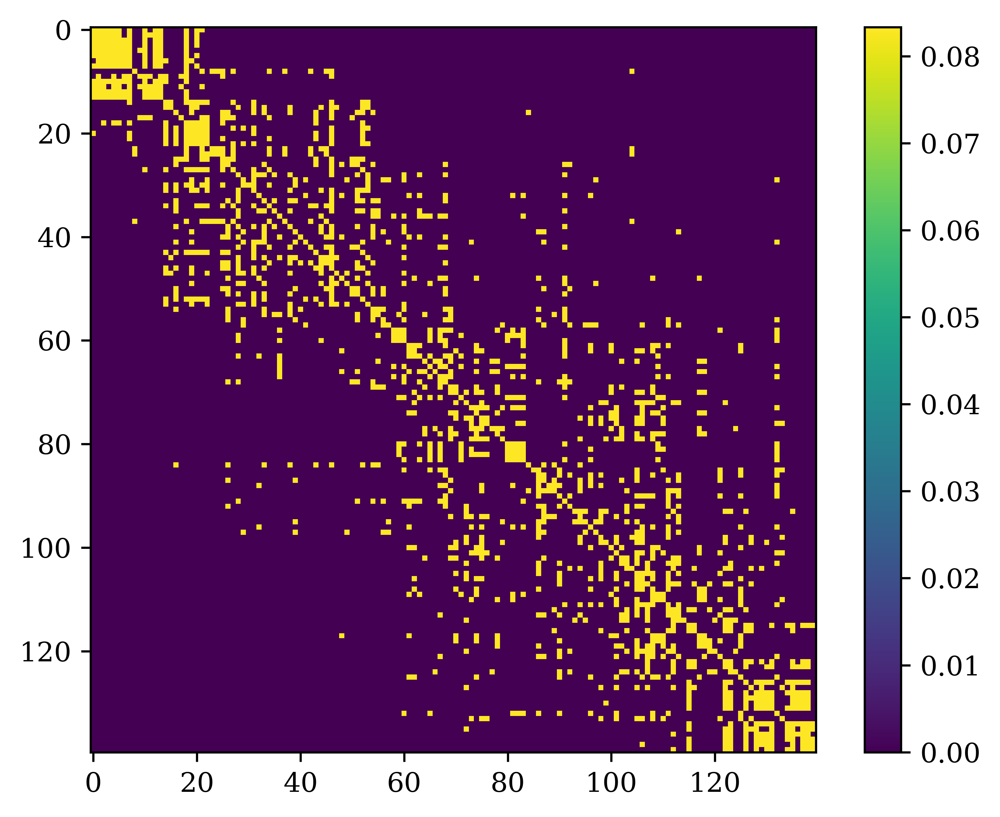

In [12]:
plt.imshow(data)
plt.colorbar()

In [13]:
beta = 0.1
smoother = np.eye(len(df)) * beta * data + (1 - beta) * data 

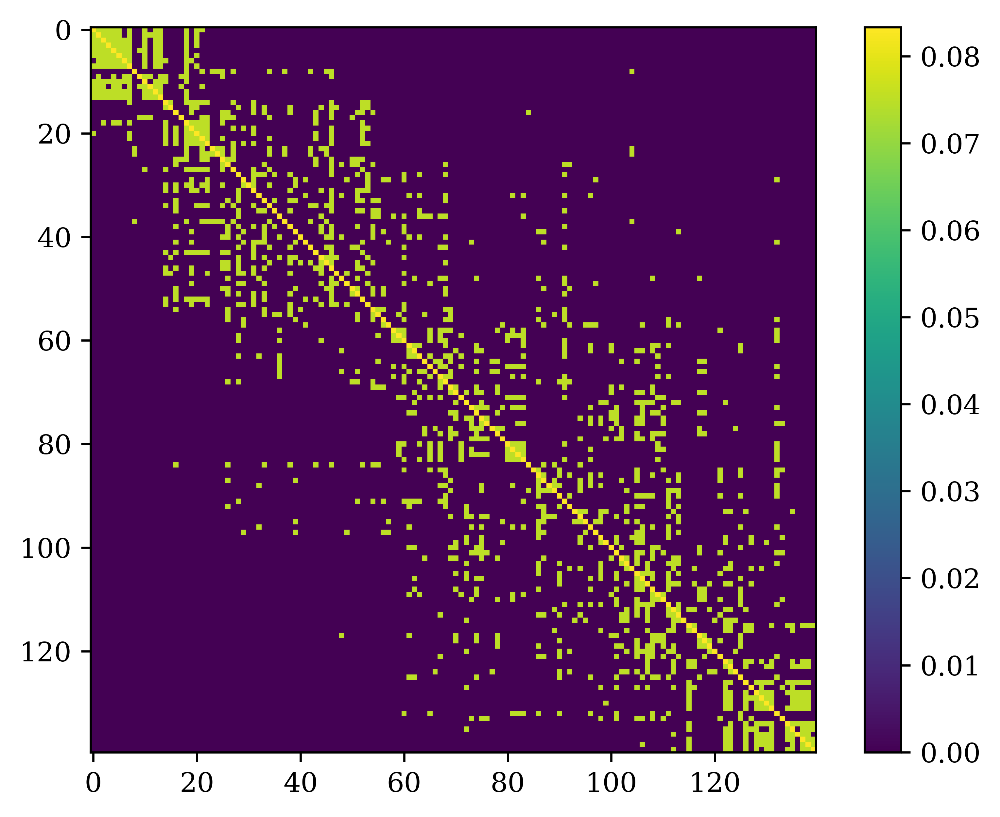

In [14]:
plt.imshow(smoother)
plt.colorbar()

In [15]:
seed_idx = np.where(df.index.get_level_values('age') == 3)[0]

In [16]:
pseudo_vals = np.zeros(len(df))

In [17]:
pseudo_vals[seed_idx] = 1

In [18]:
n_iter = 1_000
out = np.zeros((len(df), n_iter))

In [19]:
def mm_norm(x):
    return (x - x.min()) / np.ptp(x)

In [20]:
out[:, 0] = pseudo_vals
for i in trange(1, n_iter):
    out[:, i] = mm_norm(smoother @ out[:, i-1])

  0%|          | 0/999 [00:00<?, ?it/s]

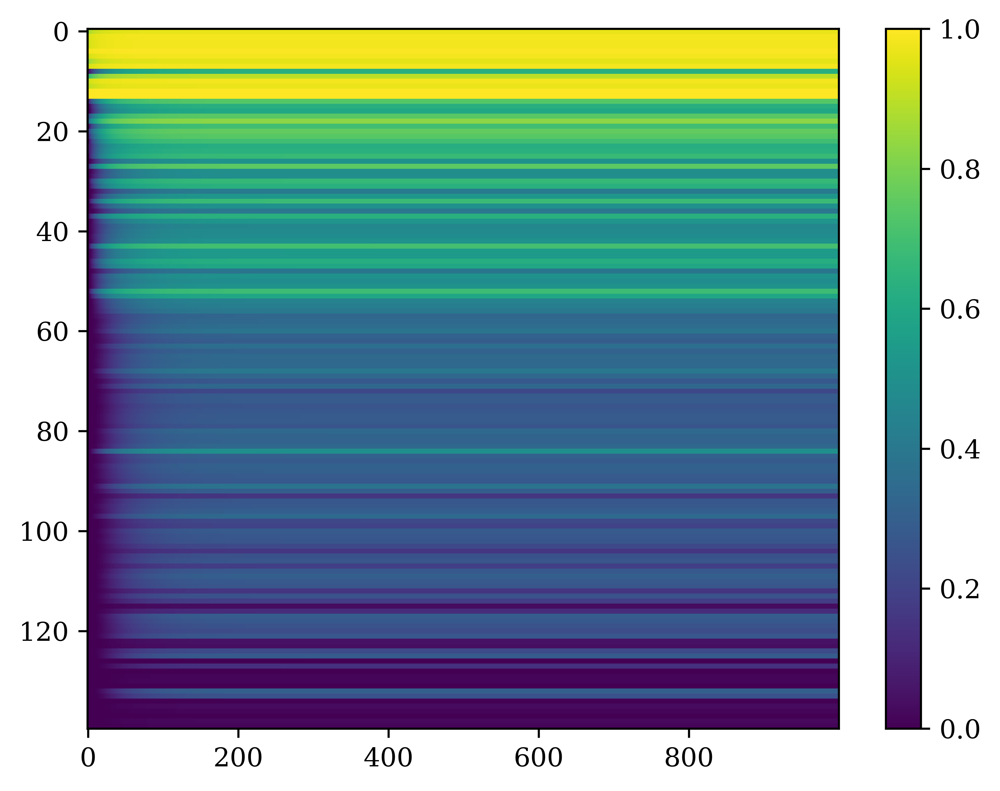

In [21]:
plt.imshow(out, aspect='auto', interpolation='none')
plt.colorbar()

In [22]:
out[:, -1]

array([0.96561499, 0.98400549, 0.98322649, 0.98322649, 0.99445331,
       0.98322649, 0.95953064, 0.98322649, 0.63059675, 0.90033622,
       0.98131687, 0.96920252, 1.        , 1.        , 0.73723753,
       0.63115082, 0.59769319, 0.74544996, 0.82627353, 0.69512263,
       0.76094686, 0.74087071, 0.69512263, 0.62418873, 0.63642151,
       0.67206648, 0.51046793, 0.74768786, 0.49597844, 0.49379614,
       0.66817436, 0.63578116, 0.41389082, 0.52466437, 0.68006928,
       0.50750194, 0.39800836, 0.63642151, 0.52215004, 0.46190559,
       0.48000922, 0.48570875, 0.50913683, 0.69922629, 0.5432436 ,
       0.54248149, 0.622804  , 0.58999898, 0.38750516, 0.50908785,
       0.48825358, 0.51048746, 0.68535992, 0.5893267 , 0.44263523,
       0.42866904, 0.40119091, 0.33001606, 0.34067449, 0.35905464,
       0.38483766, 0.31472597, 0.29588361, 0.36454339, 0.31441855,
       0.34447515, 0.33761852, 0.34335729, 0.40133903, 0.33260651,
       0.27478501, 0.3397029 , 0.21835431, 0.28807516, 0.28748

In [23]:
from scipy.stats import spearmanr, rankdata

In [24]:
ranks = rankdata(1 - out[:, -1])

In [25]:
rank_frac = ranks / ranks.max()

SignificanceResult(statistic=0.9402891939009577, pvalue=1.853468870092862e-66)


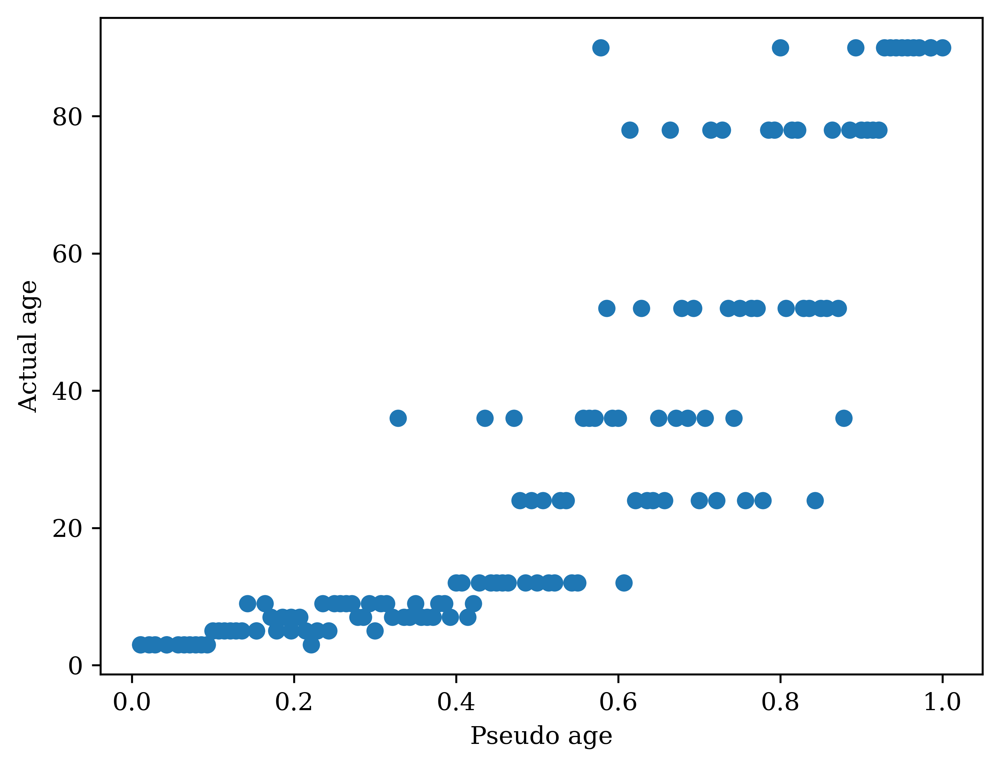

In [26]:
plt.scatter(rank_frac, df.index.get_level_values('age'))
plt.xlabel('Pseudo age')
plt.ylabel("Actual age")
print(spearmanr(rank_frac, df.index.get_level_values('age')))

In [ ]:
df = df.copy()
df['ranks'] = rank_frac

In [83]:
df.to_parquet('/n/groups/datta/win/longtogeny/data/ontogeny/version_04/ontogeny_males_clean_with_pseudotime_ranks.parquet')

/home/wg41/miniconda3/envs/aging/lib/python3.10/site-packages/pandas/io/parquet.py:159: UserWarning: The DataFrame has column names of mixed type. They will be converted to strings and not roundtrip correctly.
  table = self.api.Table.from_pandas(df, **from_pandas_kwargs)


## Fit kmeans regressor to pseudotime

In [27]:
from sklearn.neighbors import KNeighborsRegressor

In [77]:
reg = KNeighborsRegressor(n_neighbors=12, metric='cosine', weights='distance')

In [78]:
reg.fit(df, rank_frac)

KNeighborsRegressor(metric='cosine', n_neighbors=12, weights='distance')

In [79]:
male_pred = reg.predict(df)

In [80]:
fem_pred = reg.predict(female_df.reindex(columns=df.columns, fill_value=0))

In [81]:
mdf = pd.DataFrame(dict(age=df.index.get_level_values('age'), pseudo_age=male_pred))
fdf = pd.DataFrame(dict(age=female_df.index.get_level_values('age'), pseudo_age=fem_pred))

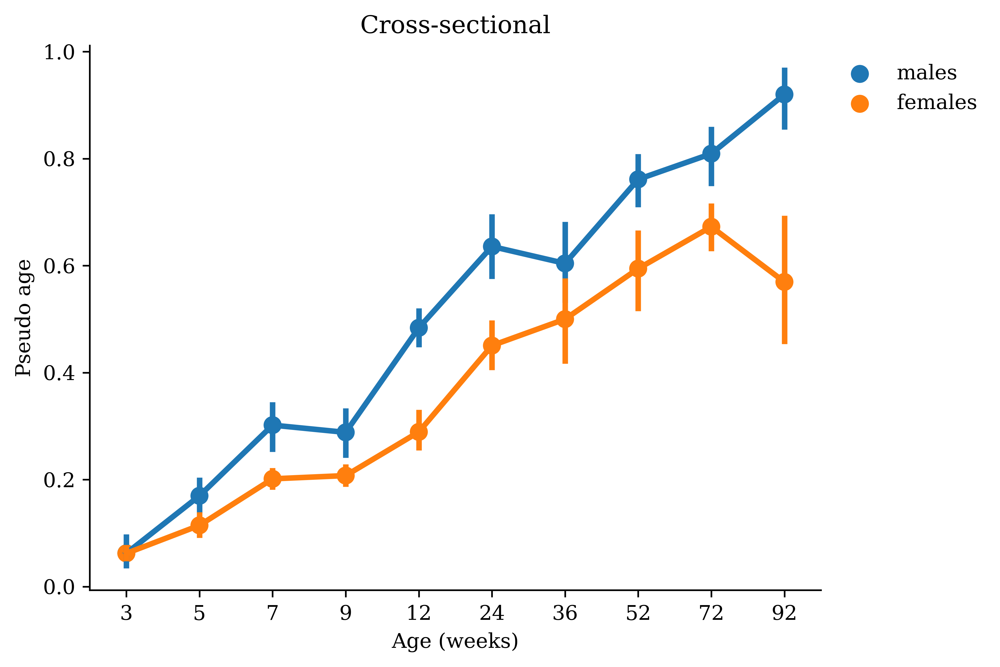

In [83]:
ax = sns.pointplot(data=mdf, x='age', y='pseudo_age', label='males')
sns.pointplot(data=fdf, x='age', y='pseudo_age', label='females', color='C1')
ax.set(ylabel='Pseudo age', xlabel='Age (weeks)', title='Cross-sectional')
sns.despine()
legend()

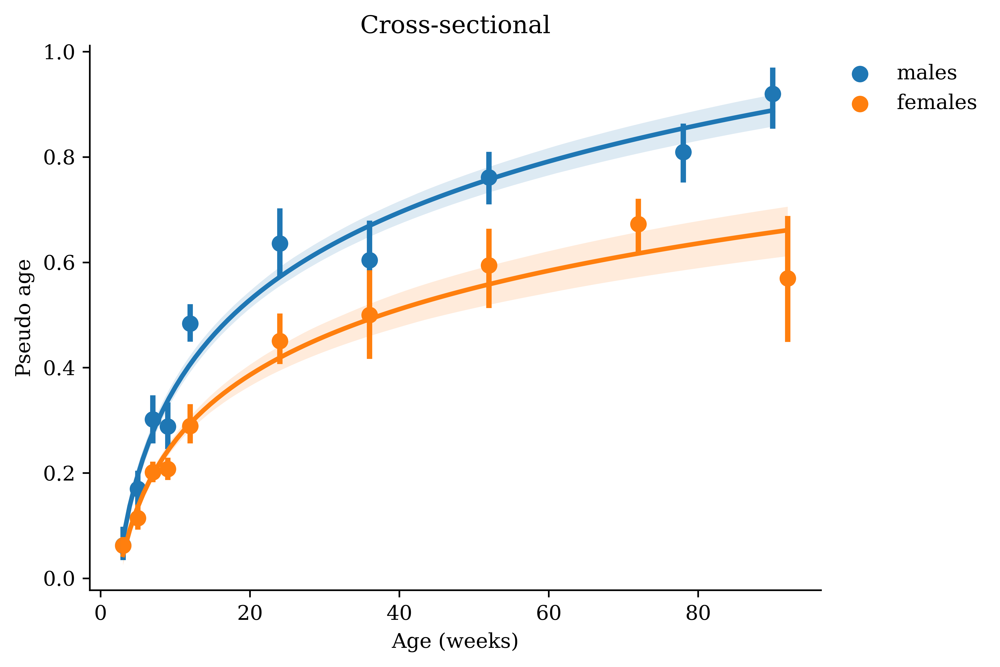

In [114]:
ax = sns.regplot(data=mdf, x='age', y='pseudo_age', label='males', fit_reg=True, x_bins=mdf['age'].nunique(), logx=True)
sns.regplot(data=fdf, x='age', y='pseudo_age', label='females', color='C1', fit_reg=True, x_bins=ldf['age'].nunique(), logx=True)
ax.set(ylabel='Pseudo age', xlabel='Age (weeks)', title='Cross-sectional')
sns.despine()
legend()

In [84]:
long_df = pd.read_parquet('/n/groups/datta/win/longtogeny/data/ontogeny/version_04/longtogeny_males_clean.parquet')

In [85]:
long_pred = reg.predict(long_df.reindex(columns=df.columns, fill_value=0))

In [89]:
ldf = pd.DataFrame(dict(age=long_df.index.get_level_values('age') / 7, pseudo_age=long_pred))

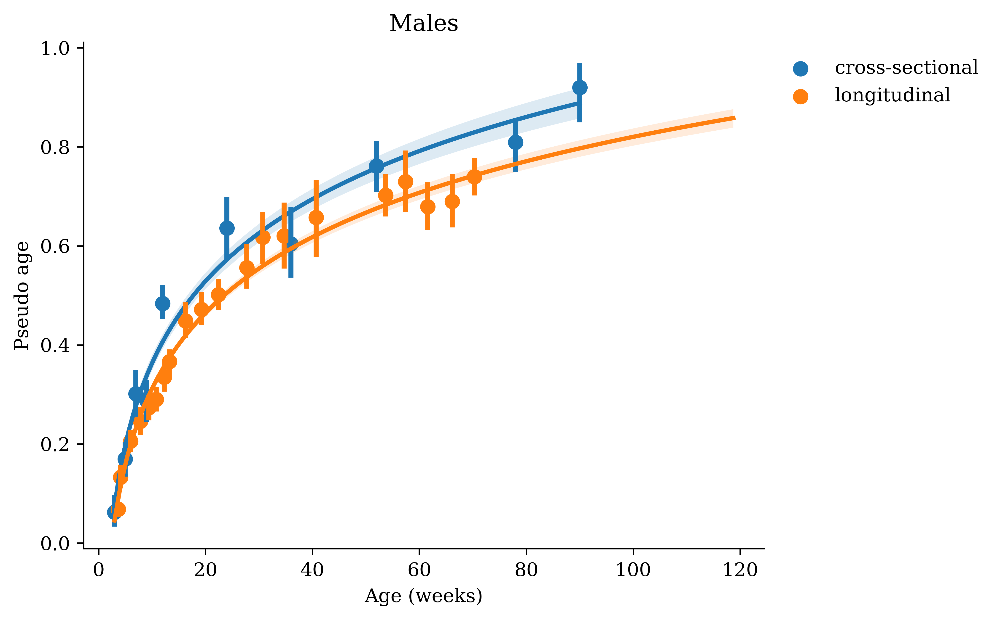

In [115]:
ax = sns.regplot(data=mdf, x='age', y='pseudo_age', label='cross-sectional', fit_reg=True, x_bins=mdf['age'].nunique(), logx=True)
sns.regplot(data=ldf, x='age', y='pseudo_age', label='longitudinal', color='C1', fit_reg=True, x_bins=20, logx=True)
ax.set(ylabel='Pseudo age', xlabel='Age (weeks)', title='Males')
sns.despine()
legend()

## Longtogeny pseudotime

In [116]:
index = NNDescent(long_df.to_numpy(), metric='cosine', n_jobs=-1)

In [117]:
k_neigh = 12

In [118]:
indices, distances = index.query(long_df.to_numpy(), k=k_neigh + 1)

In [119]:
indices.shape

(963, 13)

In [120]:
indices

array([[  0,  15,  13, ...,  54, 105,   5],
       [  1,  13,   8, ...,  71, 224, 209],
       [  2,   8,  25, ...,  20,  15,   6],
       ...,
       [960, 949, 934, ..., 953, 954, 564],
       [961, 948, 952, ..., 890, 691, 937],
       [962, 950, 515, ..., 667, 563, 954]], dtype=int32)

In [122]:
data = np.zeros((len(long_df),) * 2)
data[np.tile(np.arange(len(long_df))[:, None], (1, indices.shape[1])), indices] = 1 / k_neigh

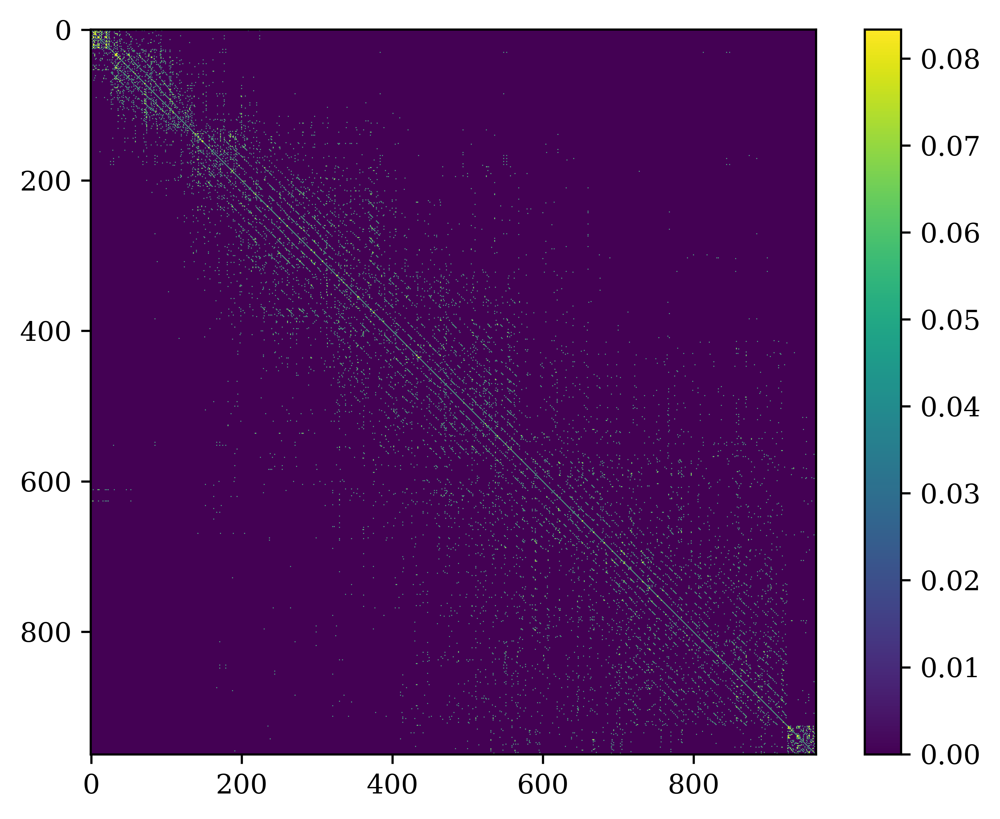

In [123]:
plt.imshow(data)
plt.colorbar()

In [143]:
beta = 0.05
smoother = np.eye(len(long_df)) * beta * data + (1 - beta) * data 

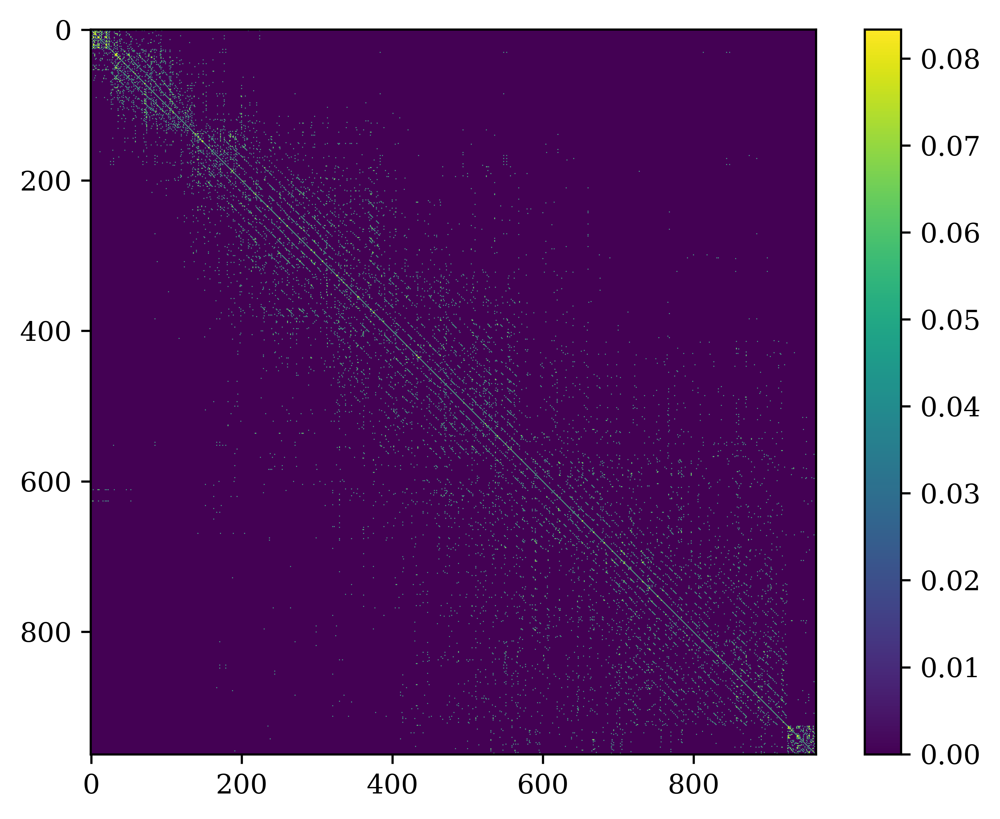

In [144]:
plt.imshow(smoother)
plt.colorbar()

In [145]:
long_df.index.get_level_values('age').min()

21

In [146]:
seed_idx = np.where(long_df.index.get_level_values('age') == 21)[0]

In [147]:
pseudo_vals = np.zeros(len(long_df))

In [148]:
pseudo_vals[seed_idx] = 1

In [149]:
n_iter = 1_000
out = np.zeros((len(long_df), n_iter))

In [150]:
def mm_norm(x):
    return (x - x.min()) / np.ptp(x)

In [151]:
out[:, 0] = pseudo_vals
for i in trange(1, n_iter):
    out[:, i] = mm_norm(smoother @ out[:, i-1])

  0%|          | 0/999 [00:00<?, ?it/s]

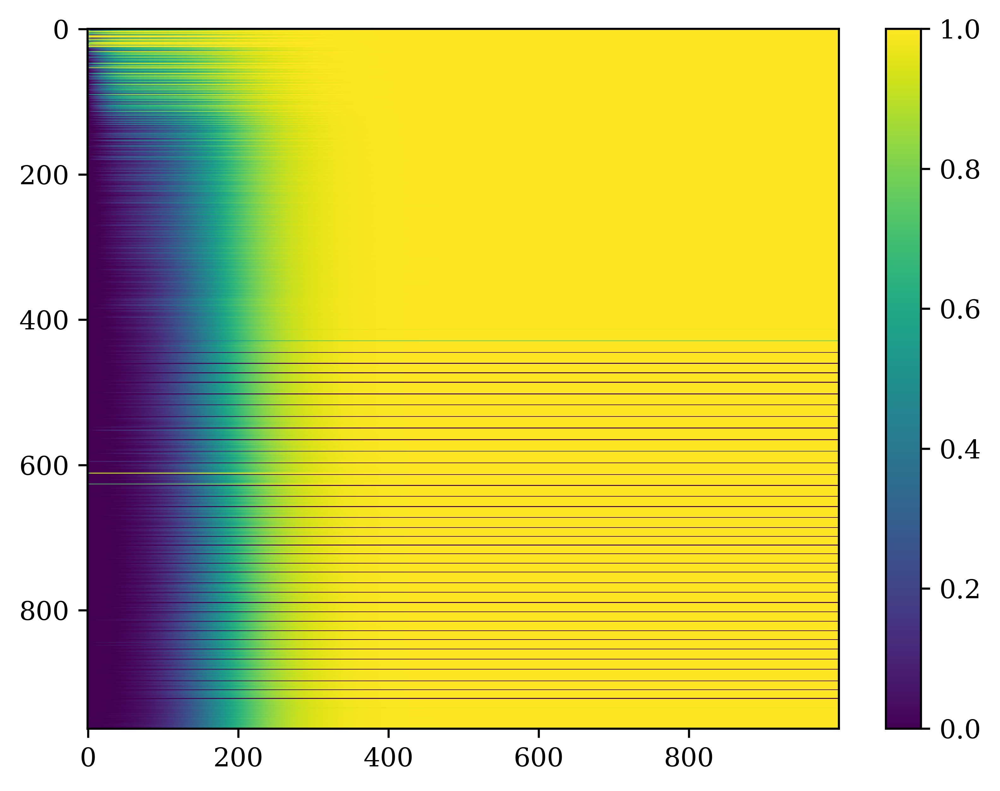

In [152]:
plt.imshow(out, aspect='auto', interpolation='none')
plt.colorbar()

In [153]:
out[:, -1]

array([9.99639748e-01, 9.99545414e-01, 9.99653125e-01, 9.99731753e-01,
       9.99717565e-01, 9.99660614e-01, 9.99714359e-01, 9.99716320e-01,
       9.99549876e-01, 9.99734417e-01, 9.99734069e-01, 9.99732257e-01,
       9.99538363e-01, 9.99627089e-01, 9.99732257e-01, 9.99675903e-01,
       9.99706369e-01, 9.99637659e-01, 9.99721182e-01, 9.99733603e-01,
       9.99719106e-01, 9.99729046e-01, 9.99618061e-01, 9.99734199e-01,
       9.99729046e-01, 9.99629036e-01, 9.99654806e-01, 9.99626091e-01,
       9.99601157e-01, 9.99617353e-01, 9.99658528e-01, 9.99716649e-01,
       9.99661487e-01, 9.99639518e-01, 9.99668119e-01, 9.99679438e-01,
       9.99609673e-01, 9.99593712e-01, 9.99657792e-01, 9.99678393e-01,
       9.99572271e-01, 9.99588828e-01, 9.99650526e-01, 9.99633114e-01,
       9.99593054e-01, 9.99547732e-01, 9.99594137e-01, 9.99709765e-01,
       9.99653932e-01, 9.99575460e-01, 9.99653831e-01, 9.99698424e-01,
       9.99604877e-01, 9.99727449e-01, 9.99665139e-01, 9.99557818e-01,
      

In [154]:
ranks = rankdata(1 - out[:, -1])

In [155]:
rank_frac = ranks / ranks.max()

SignificanceResult(statistic=-0.4598358156876095, pvalue=1.4890704894941098e-51)


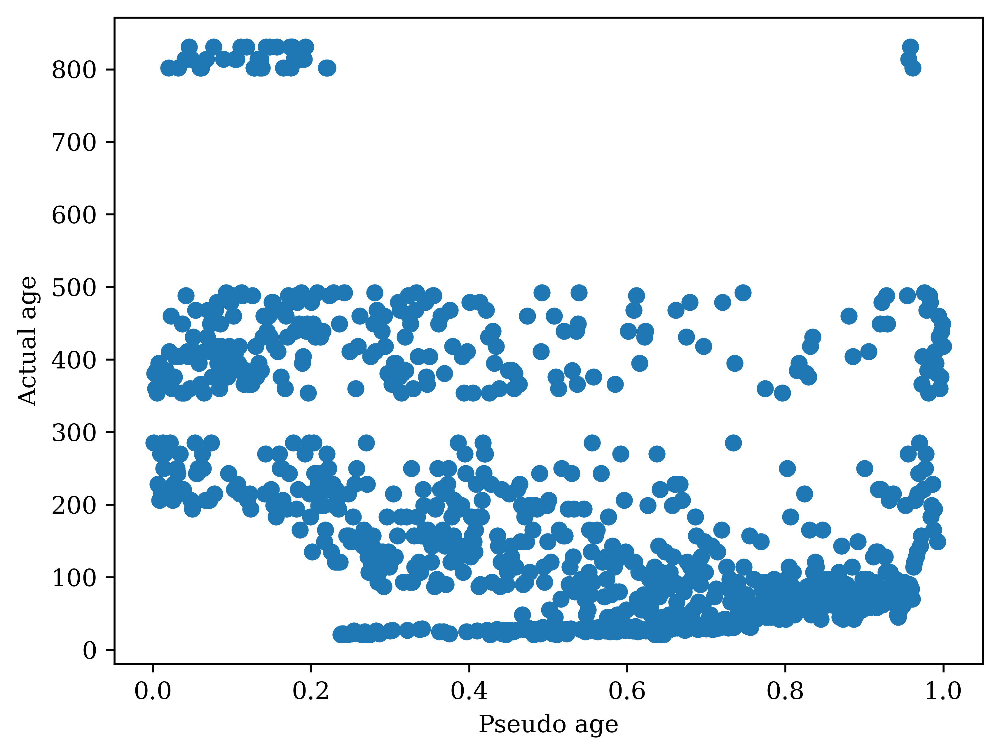

In [156]:
plt.scatter(rank_frac, long_df.index.get_level_values('age'))
plt.xlabel('Pseudo age')
plt.ylabel("Actual age")
print(spearmanr(rank_frac, long_df.index.get_level_values('age')))

In [157]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from aging.behavior.syllables import relabel_by_usage
from aging.plotting import figure
from sklearn.decomposition import PCA

In [158]:
earliest_mouse_age = 21  # days


def age(s):
    return ((s - s.min()).dt.days + earliest_mouse_age) / 7


def load_long_df(version=4, df_version=0):
    df = pd.read_parquet(
        f"/n/groups/datta/win/longtogeny/data/ontogeny/version_{version:02d}/longtogeny_males_syllable_df_v{df_version:02d}.parquet"
    )
    df = relabel_by_usage(df, return_map=False)
    df["mouse_id"] = df["subject_name"].str[:5]
    df = df[~df["mouse_id"].str.lower().str.contains("c")]
    df = df[~df["mouse_id"].str.lower().str.contains("long")]
    ages = df.groupby("mouse_id", sort=False)['date'].transform(age)
    df["age"] = ages

    session_length = df.groupby("uuid")["timestamps"].max()
    remove_uuids = session_length[session_length < 600].index
    df = df[~df["uuid"].isin(remove_uuids)]

    usage_df = (
        df.query("onsets")
        .groupby(["age", "mouse_id", "uuid"])["relabeled_syllables"]
        .value_counts(normalize=True)
    )
    usage_df.name = "usage"
    usage_df = usage_df.reset_index()
    usage_mtx = usage_df.pivot_table(
        values="usage", columns="relabeled_syllables", index=["age", "mouse_id", "uuid"]
    ).fillna(0)

    # remove sessions with abnormally high syllable usage
    usage_mtx = usage_mtx[~(usage_mtx > 0.15).any(axis=1)]

    # remove sessions with abnormally few syllables used
    usage_mtx = usage_mtx[(usage_mtx > 0).sum(axis=1) > 20]
    return usage_mtx.drop('05_02', level='mouse_id')

In [160]:
long_df = load_long_df()

In [161]:
index = NNDescent(long_df.to_numpy(), metric='cosine', n_jobs=-1)

In [322]:
k_neigh = 32

In [323]:
indices, distances = index.query(long_df.to_numpy(), k=k_neigh + 1)

In [324]:
indices.shape

(941, 33)

In [325]:
indices

array([[  0,  26,   1, ..., 102, 122,  60],
       [  1,  38,   0, ...,  14,  85,  45],
       [  2,  24,  15, ..., 193,  83,  53],
       ...,
       [938, 874, 765, ..., 538, 447, 683],
       [939, 843, 855, ..., 874, 554, 909],
       [940, 897, 916, ..., 597, 927, 430]], dtype=int32)

In [326]:
data = np.zeros((len(long_df),) * 2)
data[np.tile(np.arange(len(long_df))[:, None], (1, indices.shape[1])), indices] = 1 / k_neigh

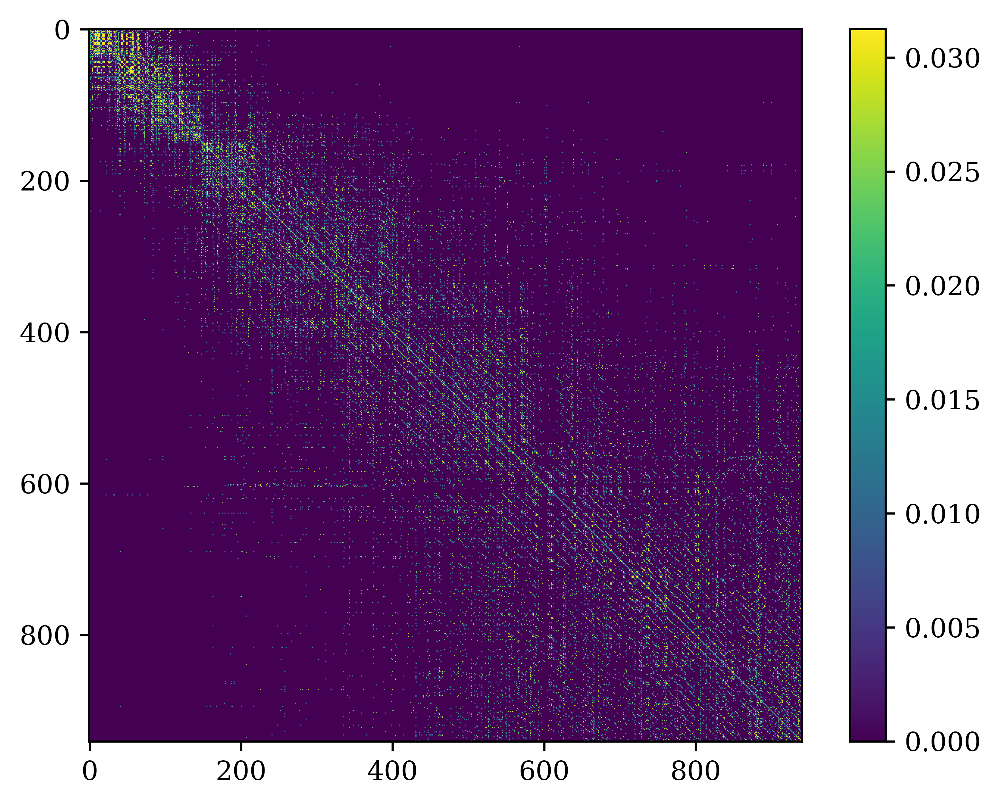

In [327]:
plt.imshow(data)
plt.colorbar()

In [328]:
beta = 0.1
smoother = np.eye(len(long_df)) * beta * data + (1 - beta) * data 

In [329]:
seed_idx = np.where(long_df.index.get_level_values('age') == 3.0)[0]

In [330]:
pseudo_vals = np.zeros(len(long_df))
pseudo_vals[seed_idx] = 1

n_iter = 1_000
out = np.zeros((len(long_df), n_iter))

out[:, 0] = pseudo_vals
for i in trange(1, n_iter):
    out[:, i] = mm_norm(smoother @ out[:, i-1])

  0%|          | 0/999 [00:00<?, ?it/s]

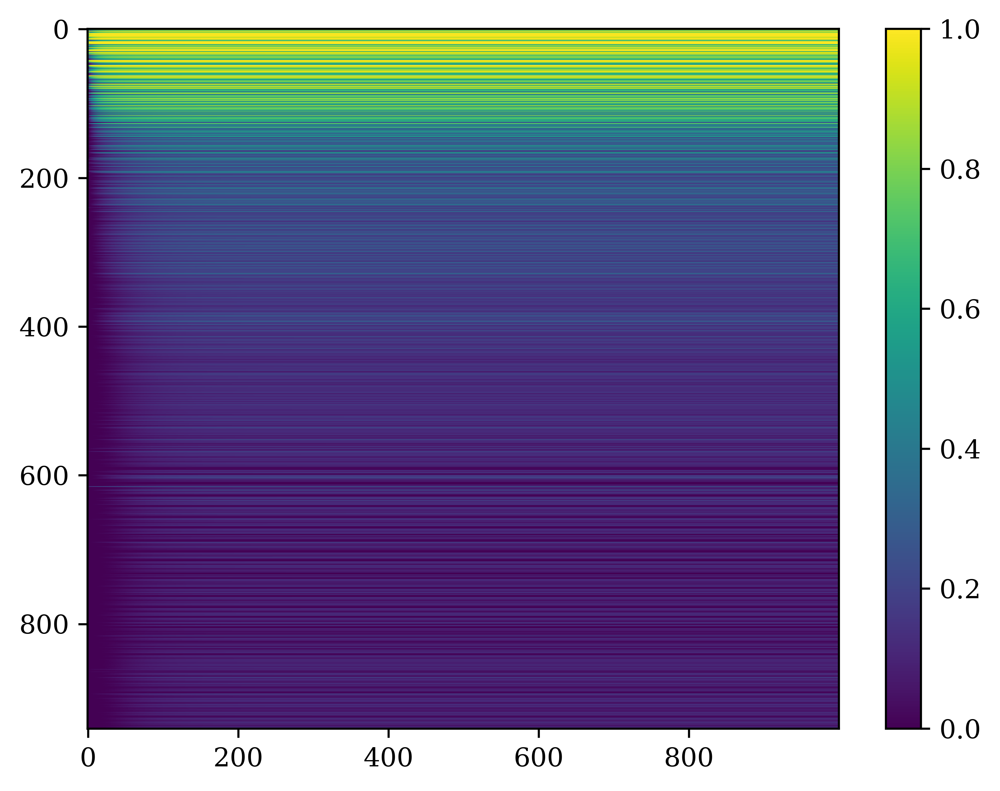

In [331]:
plt.imshow(out, aspect='auto', interpolation='none')
plt.colorbar()

In [332]:
out[:, -1]

array([7.84494182e-01, 8.84915948e-01, 7.28294164e-01, 9.71084459e-01,
       8.16838286e-01, 8.90245080e-01, 1.00000000e+00, 9.95028295e-01,
       9.84366707e-01, 9.94972495e-01, 9.73025433e-01, 8.87166022e-01,
       9.68709676e-01, 9.95274620e-01, 9.61298094e-01, 6.85395016e-01,
       8.07540487e-01, 9.92995329e-01, 9.97538041e-01, 9.84294760e-01,
       9.95384192e-01, 6.30292333e-01, 8.63939455e-01, 7.85440182e-01,
       8.15479172e-01, 9.87357993e-01, 8.43479988e-01, 9.16033107e-01,
       9.96447188e-01, 9.84798676e-01, 6.06126607e-01, 9.19073653e-01,
       9.43661119e-01, 8.75128937e-01, 9.64906792e-01, 6.57788309e-01,
       8.39417172e-01, 7.69930040e-01, 8.66811862e-01, 7.13858928e-01,
       6.94112299e-01, 5.64861333e-01, 9.99530118e-01, 9.56065185e-01,
       9.80137035e-01, 8.00381147e-01, 6.34301353e-01, 5.01234270e-01,
       6.73326262e-01, 9.90310060e-01, 9.70718837e-01, 8.71031428e-01,
       7.90487660e-01, 6.47739376e-01, 7.99668699e-01, 8.83383038e-01,
      

In [333]:
ranks = rankdata(1 - out[:, -1])

rank_frac = ranks / ranks.max()

print(spearmanr(rank_frac, long_df.index.get_level_values('age')))

SignificanceResult(statistic=0.8720492854329772, pvalue=1.2142901612799866e-293)


SignificanceResult(statistic=0.8720492854329772, pvalue=1.2142901612799866e-293)


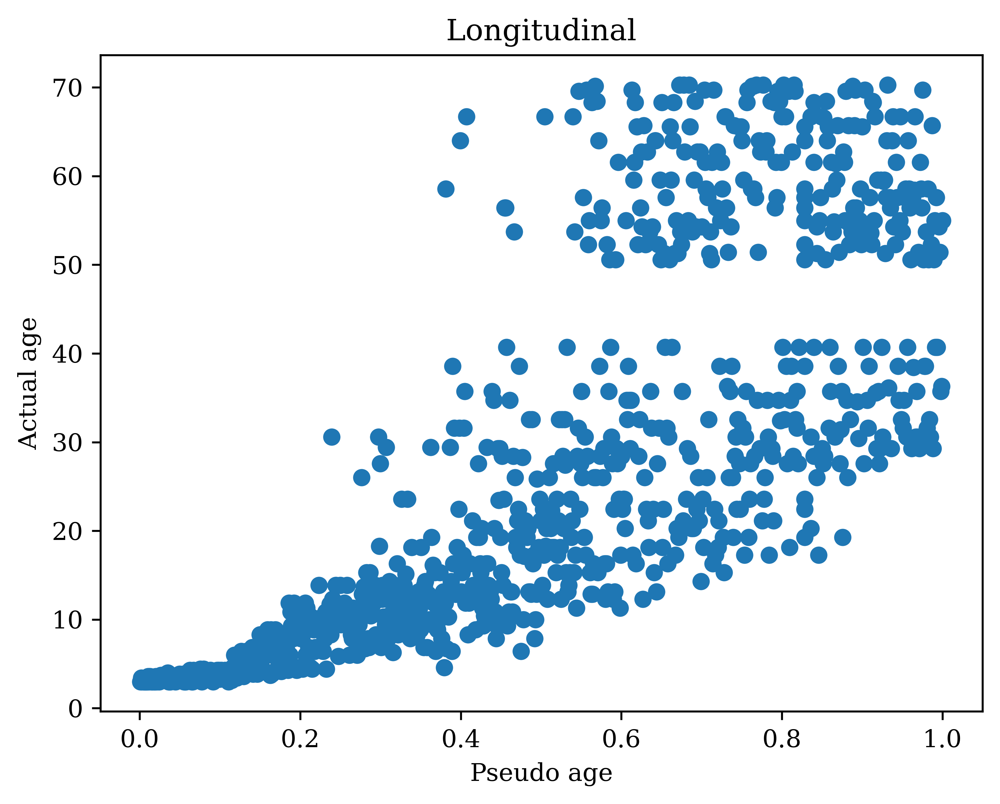

In [334]:
plt.scatter(rank_frac, long_df.index.get_level_values('age'))
plt.xlabel('Pseudo age')
plt.ylabel("Actual age")
plt.title('Longitudinal')
print(spearmanr(rank_frac, long_df.index.get_level_values('age')))

In [299]:
from sklearn.preprocessing import LabelEncoder
import colorcet as cc

In [335]:
enc = LabelEncoder().fit(long_df.index.get_level_values('mouse_id'))

Text(0.5, 1.0, 'Longitudinal (+ smoothing)')

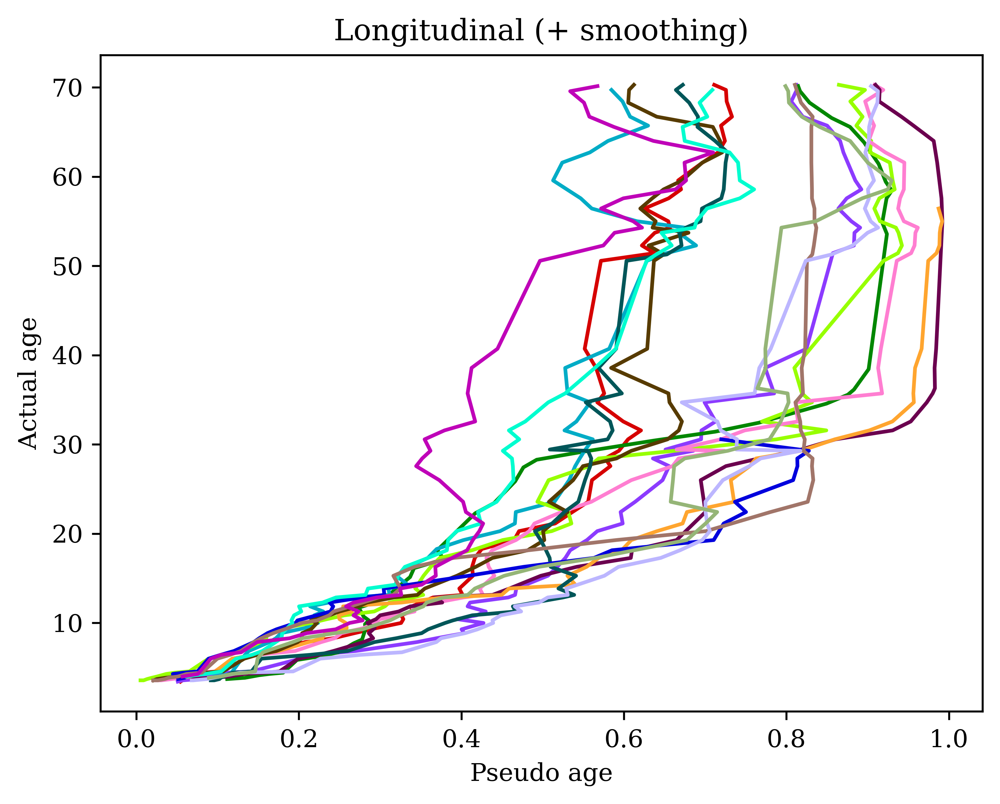

In [342]:
new_ser = pd.Series(rank_frac, index=long_df.index)

for mouse, s in new_ser.groupby('mouse_id'):
    l = enc.transform([mouse])[0]
    plt.plot(s.rolling(5).mean(), s.index.get_level_values('age'), c=cc.glasbey[l])
                
plt.xlabel('Pseudo age')
plt.ylabel("Actual age")
plt.title('Longitudinal (+ smoothing)')

Text(0.5, 1.0, 'Longitudinal')

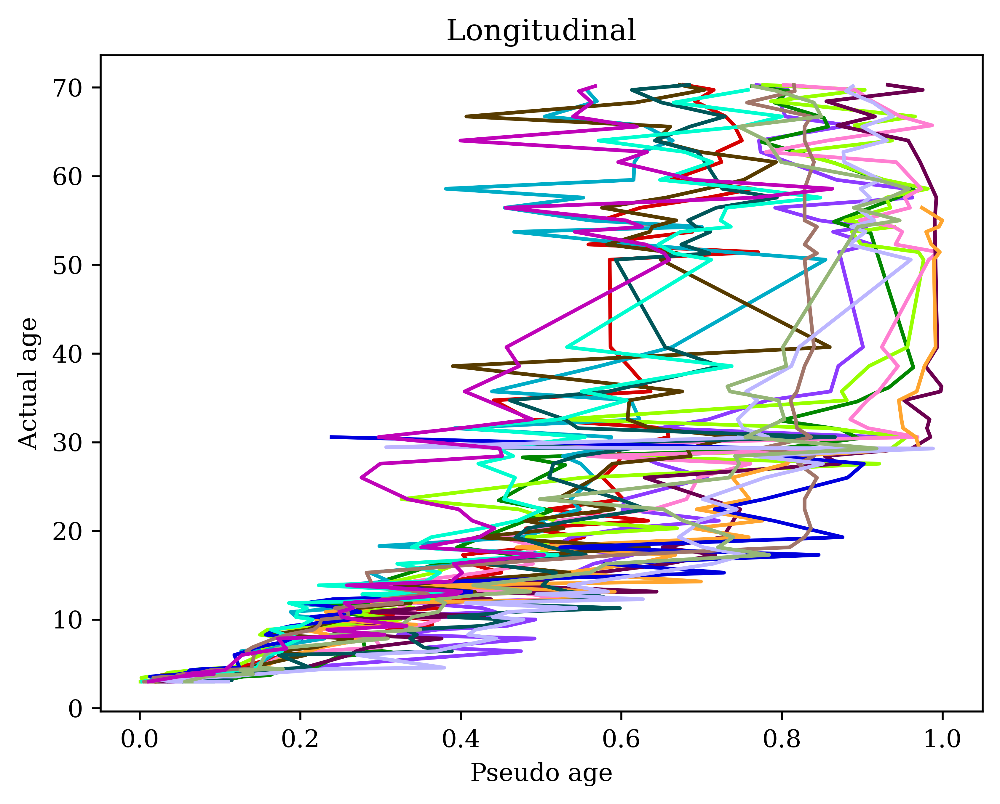

In [337]:
new_ser = pd.Series(rank_frac, index=long_df.index)

for mouse, s in new_ser.groupby('mouse_id'):
    l = enc.transform([mouse])[0]
    plt.plot(s, s.index.get_level_values('age'), c=cc.glasbey[l])
                
plt.xlabel('Pseudo age')
plt.ylabel("Actual age")
plt.title('Longitudinal')

In [316]:
corrs = {}
age_pred_var = {}
n_iter = 2_000
for k_neigh in range(3, 100):

    indices, distances = index.query(long_df.to_numpy(), k=k_neigh + 1)

    data = np.zeros((len(long_df),) * 2)
    data[np.tile(np.arange(len(long_df))[:, None], (1, indices.shape[1])), indices] = 1 / k_neigh

    beta = 0.1
    smoother = np.eye(len(long_df)) * beta * data + (1 - beta) * data 

    seed_idx = np.where(long_df.index.get_level_values('age') == 3.0)[0]

    pseudo_vals = np.zeros(len(long_df))
    pseudo_vals[seed_idx] = 1

    out = np.zeros((len(long_df), n_iter))

    out[:, 0] = pseudo_vals
    for i in range(1, n_iter):
        out[:, i] = mm_norm(smoother @ out[:, i-1])

    ranks = rankdata(1 - out[:, -1])

    rank_frac = ranks / ranks.max()
    _c = spearmanr(rank_frac, long_df.index.get_level_values('age'))
    print(k_neigh, _c)
    corrs[k_neigh] = _c.statistic
    new_ser = pd.Series(rank_frac, index=long_df.index)

    avg_age_change = new_ser.groupby('mouse_id').apply(lambda v: v.diff(1).mean()).mean()
    print(k_neigh, avg_age_change)
    age_pred_var[k_neigh] = avg_age_change

3 SignificanceResult(statistic=0.36168277747754396, pvalue=1.851277185776641e-30)
3 0.006768032493438334
4 SignificanceResult(statistic=0.24339255964204046, pvalue=3.7193843200459823e-14)
4 0.007857334812569658
5 SignificanceResult(statistic=0.8290681254549279, pvalue=2.6548844373015723e-239)
5 0.01287514464347582
6 SignificanceResult(statistic=0.8462598483571759, pvalue=5.1159492923516694e-259)
6 0.01304389835186626
7 SignificanceResult(statistic=0.8568380959592056, pvalue=2.1519484687365137e-272)
7 0.013114621450287592
8 SignificanceResult(statistic=0.8625793599849251, pvalue=4.109835573740354e-280)
8 0.012636458582682005
9 SignificanceResult(statistic=-0.35297256126060456, pvalue=5.406962666600799e-29)
9 0.0021586913564914565
10 SignificanceResult(statistic=-0.29196646420810496, pvalue=5.998871499106802e-20)
10 0.0026342165304157877
11 SignificanceResult(statistic=-0.27752015986644213, pvalue=4.218691895249319e-18)
11 0.0028981542769433676
12 SignificanceResult(statistic=-0.29224320

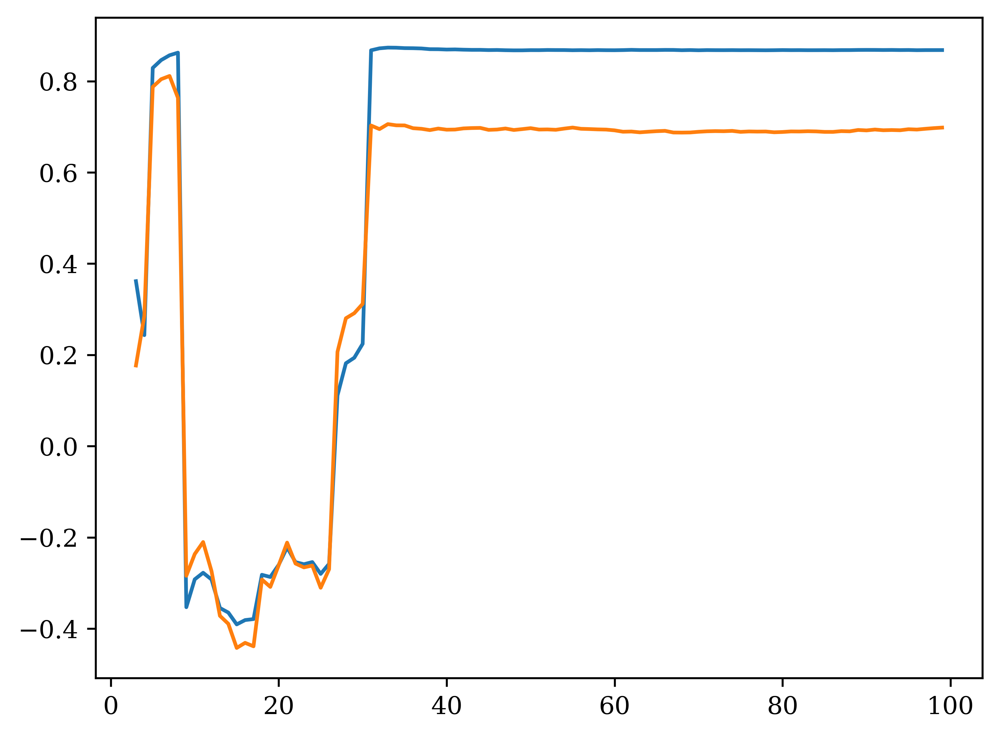

In [321]:
plt.plot(corrs.keys(), corrs.values())
plt.plot(age_pred_var.keys(), [x * 100 - 0.5 for x in age_pred_var.values()])

In [282]:
max(corrs.items(), key=lambda v: v[1])

(33, 0.8736504280814845)

In [313]:
corrs

{3: 0.36168277747754396,
 4: 0.24339255964204046,
 5: 0.8290681254549279,
 6: 0.8462598483571759,
 7: 0.8568380959592056,
 8: 0.8625793599849251,
 9: -0.35297256126060456,
 10: -0.29196646420810496,
 11: -0.27752015986644213,
 12: -0.2922432010713425,
 13: -0.3547091512329246,
 14: -0.36475795787201437,
 15: -0.39068694370184104,
 16: -0.3812040818129349,
 17: -0.3790524938822767,
 18: -0.28196632986162834,
 19: -0.2867767404493017,
 20: -0.2602013449604639,
 21: -0.22186760725384663,
 22: -0.2542007334363574,
 23: -0.25878155144536225,
 24: -0.2540859550293744,
 25: -0.27997207680117175,
 26: -0.25795706745033564,
 27: 0.11114634808247455,
 28: 0.18171492195650452,
 29: 0.1938242130859185,
 30: 0.22436901303731446,
 31: 0.8677454480170158,
 32: 0.8720492854329772,
 33: 0.8736504280814845,
 34: 0.8734236424945744,
 35: 0.8725222746310879,
 36: 0.8723259374250741,
 37: 0.8717679476500672,
 38: 0.870212804137678,
 39: 0.8700824838728297,
 40: 0.8694197850995466,
 41: 0.8696908831214804,
